In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load
import os
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px 
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
from collections import defaultdict
import difflib

import warnings
warnings.filterwarnings("ignore")

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/spotify-dataset/data/data_by_year.csv
/kaggle/input/spotify-dataset/data/data_by_genres.csv
/kaggle/input/spotify-dataset/data/data_w_genres.csv
/kaggle/input/spotify-dataset/data/data_by_artist.csv
/kaggle/input/spotify-dataset/data/data.csv


***
# Reading Data

In [2]:
data = pd.read_csv("../input/spotify-dataset/data/data.csv")
genre_data = pd.read_csv('../input/spotify-dataset/data/data_by_genres.csv')
year_data = pd.read_csv('../input/spotify-dataset/data/data_by_year.csv')
artist_data = pd.read_csv('../input/spotify-dataset/data/data_by_artist.csv')

In [3]:
data.head(2)

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936


In [4]:
genre_data.head(2)

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.3616,-31.514333,0.040567,75.336500,0.103783,27.833333,6
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.1310,-16.854000,0.076817,120.285667,0.221750,52.500000,5


In [5]:
year_data.head(2)

,mode,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,1921,0.886896,0.418597,260537.166667,0.231815,0.344878,0.20571,-17.048667,0.073662,101.531493,0.379327,0.653333,2
1,1,1922,0.938592,0.482042,165469.746479,0.237815,0.434195,0.24072,-19.275282,0.116655,100.884521,0.535549,0.140845,10


In [6]:
artist_data.head(2)

,mode,count,acousticness,artists,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,9,0.590111,"""Cats"" 1981 Original London Cast",0.467222,250318.555556,0.394003,0.011400,0.290833,-14.448,0.210389,117.518111,0.389500,38.333333,5
1,1,26,0.862538,"""Cats"" 1983 Broadway Cast",0.441731,287280.000000,0.406808,0.081158,0.315215,-10.690,0.176212,103.044154,0.268865,30.576923,5


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [8]:
genre_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB


In [9]:
data['decade'] = data['year'].apply(lambda year : f'{(year//10)*10}s' )

***
# EDA

<AxesSubplot:xlabel='decade', ylabel='count'>

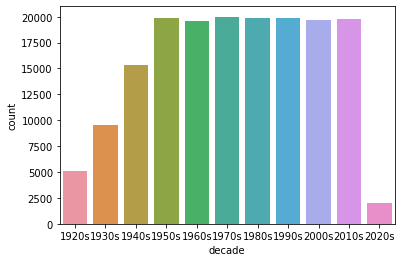

In [10]:
sns.countplot(data['decade'],)

In [11]:
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']
fig = px.line(year_data, x='year', y=sound_features,title='Trend of various sound features over decades')
fig.show()

In [12]:
fig = px.line(year_data, x='year', y='loudness',title='Trend of loudness over decades')
fig.show()

In [13]:
top10_genres = genre_data.nlargest(10, 'popularity')

fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group',
            title='Trend of various sound features over top 10 genres')
fig.show()

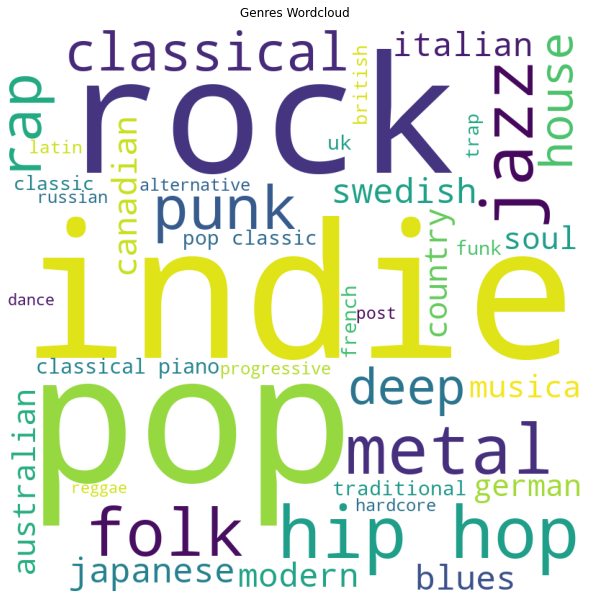

In [14]:
from wordcloud import WordCloud,STOPWORDS

stopwords = set(STOPWORDS)
comment_words = " ".join(genre_data['genres'])+" "
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                max_words=40,
                min_font_size = 10).generate(comment_words)
                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.title("Genres Wordcloud")
plt.show()

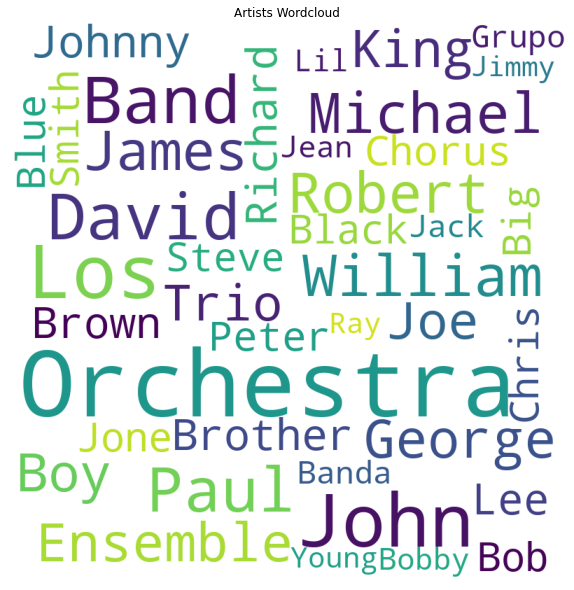

In [15]:
stopwords = set(STOPWORDS)
comment_words = " ".join(artist_data['artists'])+" "
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_word_length=3,
                max_words=40,
                min_font_size = 10).generate(comment_words)
                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.title("Artists Wordcloud")
plt.tight_layout(pad = 0)
plt.show()

In [16]:
top10_popular_artists = artist_data.nlargest(10, 'popularity')
top10_most_song_produced_artists = artist_data.nlargest(10, 'count')

In [17]:
print('Top 10 Artists that produced most songs:')
top10_most_song_produced_artists[['count','artists']].sort_values('count',ascending=False)

Top 10 Artists that produced most songs:


,count,artists
8367,3169,Francisco Canaro
28561,2422,Эрнест Хемингуэй
28560,2136,Эрих Мария Ремарк
8434,1459,Frank Sinatra
10714,1256,Ignacio Corsini
27109,1200,Vladimir Horowitz
1682,1146,Arturo Toscanini
2707,1103,Billie Holiday
12378,1061,Johnny Cash
7426,1023,Elvis Presley


In [18]:
print('Top 10 Artists that had most popularity score:')
top10_popular_artists[['popularity','artists']].sort_values('popularity',ascending=False)

Top 10 Artists that had most popularity score:


,popularity,artists
20966,93.0,Ritt Momney
14354,92.0,Lele Pons
15070,90.0,Los Legendarios
11764,89.0,Jerry Di
7463,88.0,Emilee
23687,88.0,Surf Mesa
28263,88.0,salem ilese
213,87.0,A7S
2343,86.0,Beltito
14378,86.0,Lenny Santos


***Conclusions from EDA***
* *Most of the songs range between 1950s-2010s.*
* *Energy in songs have increased over the time.*
* *Acousticness in songs have reduced greately over the decades.*
* *We can clearly see that loudness has dominantly increased over the decades and is at it's peak in 2020.*
* *In top 10 genres we can see that energy and dancebility are most noticable features.*
***

# Clustering

Here, the simple K-means clustering algorithm is used to divide the genres in this dataset into 12 clusters based on the numerical audio features of each genres.

In [19]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=12))])
X = genre_data.select_dtypes(np.number)
cluster_pipeline.fit(X)
genre_data['cluster'] = cluster_pipeline.predict(X)

In [20]:
''' Visualizing the Clusters with t-SNE
 is an unsupervised Machine Learning algorithm.
 It has become widely used in bioinformatics and more generally in data science to visualise the structure of 
 high dimensional data in 2 or 3 dimensions.
 While t-SNE is a dimensionality reduction technique, it is mostly used for visualization and not data pre-processing 
 (like you might with PCA). For this reason, you almost always reduce the dimensionality down to 2 with t-SNE, 
 so that you can then plot the data in two dimensions.
'''
from sklearn.manifold import TSNE

tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X) # returns np-array of coordinates(x,y) for each record after TSNE.
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'],title='Clusters of genres')
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.003s...
[t-SNE] Computed neighbors for 2973 samples in 0.242s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.110878
[t-SNE] KL divergence after 1000 iterations: 1.391792


In [21]:
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()), 
                                  ('kmeans', KMeans(n_clusters=25, 
                                   verbose=False))
                                 ], verbose=False)

X = data.select_dtypes(np.number)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels

In [22]:
'''
# Visualizing the Clusters with PCA
Principal Component Analysis is an unsupervised learning algorithm that is used for the dimensionality reduction in machine learning.
One of the most major differences between PCA and t-SNE is it preserves only local similarities whereas PA preserves
large pairwise distance maximize variance. It takes a set of points in high dimensional data and converts it into low dimensional data.
'''
from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'],title='Clusters of songs')
fig.show()

***
# Model

* Based on the analysis and visualizations, it’s clear that similar genres tend to have data points that are located close to each other while similar types of songs are also clustered together.
* This observation makes perfect sense. Similar genres will sound similar and will come from similar time periods while the same can be said for songs within those genres. We can use this idea to build a recommendation system by taking the data points of the songs a user has listened to and recommending songs corresponding to nearby data points.
* Spotipy is a Python client for the Spotify Web API that makes it easy for developers to fetch data and query Spotify’s catalog for songs. You have to install using pip install spotipy
* After installing Spotipy, you will need to create an app on the Spotify Developer’s page and save your Client ID and secret key.

In [23]:
!pip install spotipy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 237.8/237.8 kB 1.1 MB/s eta 0:00:00


In [24]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict
from kaggle_secrets import UserSecretsClient
user_secrets = UserSecretsClient()
CLIENT_ID = user_secrets.get_secret("CLIENT_ID")
CLIENT_SECRET = user_secrets.get_secret("CLIENT_SECRET")

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id=CLIENT_ID, 
                                                           client_secret=CLIENT_SECRET))


In [25]:
'''
Finds song details from spotify dataset. If song is unavailable in dataset, it returns none.
'''
def find_song(name, year):
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data)

In [26]:
number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']

In [27]:
'''
Fetches song details from dataset. If info is unavailable in dataset, it will search details from the spotify dataset.
'''
def get_song_data(song, spotify_data):
    try:
        song_data = spotify_data[(spotify_data['name'] == song['name']) 
                                & (spotify_data['year'] == song['year'])].iloc[0]
        print('Fetching song information from local dataset')
        return song_data
    
    except IndexError:
        print('Fetching song information from spotify dataset')
        return find_song(song['name'], song['year'])

In [28]:
'''
Fetches song info from dataset and does the mean of all numerical features of the song-data.
'''
def get_mean_vector(song_list, spotify_data):
    song_vectors = []
    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)  
    
    song_matrix = np.array(list(song_vectors))#nd-array where n is number of songs in list. It contains all numerical vals of songs in sep list.
    #print(f'song_matrix {song_matrix}')
    return np.mean(song_matrix, axis=0) # mean of each ele in list, returns 1-d array


In [29]:
'''
Flattenning the dictionary by grouping the key and forming a list of values for respective key.
'''
def flatten_dict_list(dict_list):
    flattened_dict = defaultdict()
    for key in dict_list[0].keys(): 
        flattened_dict[key] = [] # 'name', 'year'
    for dic in dict_list:
        for key,value in dic.items():
            flattened_dict[key].append(value) # creating list of values
    return flattened_dict


In [30]:
'''
Gets song list as input. 
Get mean vectors of numerical features of the input. 
Scale the mean-input as well as dataset numerical features.
calculate eculidean distance b/w mean-input and dataset.
Fetch the top 10 songs with maximum similarity.
'''
def recommend_songs( song_list, spotify_data, n_songs=10):
    
    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)
    
    song_center = get_mean_vector(song_list, spotify_data)
    #print(f'song_center {song_center}')
    scaler = song_cluster_pipeline.steps[0][1] # StandardScalar()
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    #print(f'distances {distances}')
    index = list(np.argsort(distances)[:, :n_songs][0])
    
    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')

In [31]:
recommend_songs([{'name': 'Blinding Lights', 'year': 2019}],  data)

Fetching song information from spotify dataset


[{'name': 'Best News Ever', 'year': 2017, 'artists': "['MercyMe']"},
 {'name': 'Bit By Bit', 'year': 2012, 'artists': "['Mother Mother']"},
 {'name': 'A Different World (feat. Corey Taylor)',
  'year': 2016,
  'artists': "['Korn', 'Corey Taylor']"},
 {'name': 'Sober', 'year': 2015, 'artists': "['Selena Gomez']"},
 {'name': "Don't Say Goodnight",
  'year': 2014,
  'artists': "['Hot Chelle Rae']"},
 {'name': 'Sight of the Sun - Single Version',
  'year': 2014,
  'artists': "['fun.']"},
 {'name': 'This Life',
  'year': 2011,
  'artists': "['Curtis Stigers', 'The Forest Rangers']"},
 {'name': 'Re-Do', 'year': 2012, 'artists': "['Modern Baseball']"},
 {'name': 'I Will Follow', 'year': 2010, 'artists': "['Chris Tomlin']"},
 {'name': "Livin' The Dream", 'year': 2016, 'artists': "['Drake White']"}]

In [32]:
recommend_songs([{'name': 'Fix You', 'year':2005}],  data)

Fetching song information from local dataset


[{'name': 'Have I Told You Lately',
  'year': 1989,
  'artists': "['Van Morrison']"},
 {'name': 'Amazing Grace (My Chains Are Gone)',
  'year': 2020,
  'artists': "['Pentatonix']"},
 {'name': 'Fine Line', 'year': 2019, 'artists': "['Harry Styles']"},
 {'name': 'Goodbye', 'year': 1993, 'artists': "['Air Supply']"},
 {'name': 'Thank You For Loving Me', 'year': 2000, 'artists': "['Bon Jovi']"},
 {'name': 'Stop Crying Your Heart Out', 'year': 2002, 'artists': "['Oasis']"},
 {'name': 'Awake My Soul', 'year': 2009, 'artists': "['Mumford & Sons']"},
 {'name': 'Ashes of Eden', 'year': 2015, 'artists': "['Breaking Benjamin']"},
 {'name': 'Go the Distance', 'year': 1997, 'artists': "['Michael Bolton']"}]

In [33]:



recommend_songs([{'name': 'I Will Follow', 'year':2010},{'name': 'Come As You Are', 'year':1991}],  data)

Fetching song information from local dataset
Fetching song information from local dataset


[{'name': 'Face Down',
  'year': 2006,
  'artists': "['The Red Jumpsuit Apparatus']"},
 {'name': 'BURN IT DOWN', 'year': 2012, 'artists': "['Linkin Park']"},
 {'name': 'The Last Stand', 'year': 2016, 'artists': "['Sabaton']"},
 {'name': 'In Your Eyes (feat. Kenny G) - Remix',
  'year': 2020,
  'artists': "['The Weeknd', 'Kenny G']"},
 {'name': 'Pray to God (feat. HAIM)',
  'year': 2014,
  'artists': "['Calvin Harris', 'HAIM']"},
 {'name': '空に歌えば', 'year': 2017, 'artists': "['amazarashi']"},
 {'name': 'Stranded', 'year': 2016, 'artists': "['Gojira']"},
 {'name': 'Tequila - R3HAB Remix',
  'year': 2018,
  'artists': "['Dan + Shay', 'R3HAB']"},
 {'name': 'Charlie', 'year': 2006, 'artists': "['Red Hot Chili Peppers']"},
 {'name': 'War of Change',
  'year': 2012,
  'artists': "['Thousand Foot Krutch']"}]